In [1]:
import anndata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
import seaborn as sns


from dredFISH.Utils import basicu
from dredFISH.Utils import powerplots

In [2]:
sns.set_context('talk')

In [3]:
f = '../data_dump/counts/P28_nr_allcells_Oct24.h5ad'
adata_nr = anndata.read(f)
adata_nr

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 23930 × 53547
    obs: 'cov', 'covfactor', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'Doublet', 'Doublet Score', 'Class_broad', 'sample', 'Type', 'Subclass'
    var: 'id'

In [4]:
f = '../data_dump/counts/P28_dr_allcells_Oct25.h5ad'
adata_dr = anndata.read(f)
adata_dr

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 24816 × 53547
    obs: 'cov', 'covfactor', 'n_genes', 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'sample', 'Type', 'Subclass'
    var: 'id'

In [5]:
adata_nr.obs['Type'].unique()

['L6CT_B', 'L4_A', 'L2/3_C', 'L4_B', 'L2/3_B', ..., 'Astro_B', 'VLMC_A', 'OD_C', 'VLMC_B', 'OPC_B']
Length: 42
Categories (42, object): ['Astro_A', 'Astro_B', 'Endo', 'Frem1', ..., 'VLMC_B', 'Vip_A', 'Vip_B', 'Vip_C']

In [6]:
adata_dr.obs['Type'].unique()

['L4_1', 'L4_2', 'L2/3_3', 'L5NP', 'L4_C', ..., 'VLMC_A', 'OD_C', 'OD_A', 'Astro_B', 'OPC_B']
Length: 42
Categories (42, object): ['Astro_A', 'Astro_B', 'Endo', 'Frem1', ..., 'VLMC_B', 'Vip_A', 'Vip_B', 'Vip_C']

In [7]:
nr_types = np.sort(adata_nr.obs['Type'].unique().astype(str))
nr_types

array(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_A', 'L2/3_B',
       'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A',
       'L5PT_B', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b',
       'Lamp5', 'Micro', 'OD_A', 'OD_B', 'OD_C', 'OPC_A', 'OPC_B',
       'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Sst_A', 'Sst_B',
       'Sst_C', 'Sst_D', 'Sst_E', 'Stac', 'VLMC_A', 'VLMC_B', 'Vip_A',
       'Vip_B', 'Vip_C'], dtype='<U7')

In [8]:
dr_types = np.sort(adata_dr.obs['Type'].unique().astype(str))
dr_types

array(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_1', 'L2/3_2',
       'L2/3_3', 'L4_1', 'L4_2', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A',
       'L5PT_B', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b',
       'Lamp5', 'Micro', 'OD_A', 'OD_B', 'OD_C', 'OPC_A', 'OPC_B',
       'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Sst_A', 'Sst_B',
       'Sst_C', 'Sst_D', 'Sst_E', 'Stac', 'VLMC_A', 'VLMC_B', 'Vip_A',
       'Vip_B', 'Vip_C'], dtype='<U7')

In [9]:
def get_normed_bulks(mat, genes, types):
    """
    - select expressed genes
    - sparse to dense
    - merge cells to clusters
    - log10(CPM+1) norm bulk samples
    """
    ncell, ngene = mat.shape
    cellcov = np.asarray(mat.sum(axis=1)).reshape(-1,)
    genecov = np.asarray(mat.sum(axis=0)).reshape(-1,)
    cond = genecov>ncell*0.01 # expressed in at least 1% of cells
    matsub = np.asarray(mat[:,cond].todense())
    
    # pseudo-bulk samples -- pull counts from cells
    Xk, xclsts = basicu.group_sum(matsub, types)
    ck, xclsts = basicu.group_sum(cellcov.reshape(-1,1), types)
    Xk = np.log10(1+(np.array(Xk)/np.array(ck))*1e6) # log10(1+CPM)
    df = pd.DataFrame(Xk, index=xclsts, columns=genes[cond])
    return df.T # gene by types 

def get_normed_bulks_for_adata_by_types(adata):
    """
    """
    return get_normed_bulks(adata.X.copy(), adata.var.index.values, adata.obs['Type'])

In [10]:
adata_nr.obs['biosample'] = adata_nr.obs['sample'].apply(lambda x: x[:-1])
adata_dr.obs['biosample'] = adata_dr.obs['sample'].apply(lambda x: x[:-1])

In [11]:
samples_nr = np.unique(adata_nr.obs['biosample'])
samples_dr = np.unique(adata_dr.obs['biosample'])
samples_nr, samples_dr

(array(['P28_1', 'P28_2'], dtype=object),
 array(['P28_dr_1', 'P28_dr_3'], dtype=object))

In [12]:
%%time
dfs_nr = []
for samp in samples_nr:
    adatasub = adata_nr[adata_nr.obs['biosample']==samp]
    df = get_normed_bulks_for_adata_by_types(adatasub)
    print(df.shape)
    print(df.columns)
    dfs_nr.append(df)

dfs_dr = []
for samp in samples_dr:
    adatasub = adata_dr[adata_dr.obs['biosample']==samp]
    df = get_normed_bulks_for_adata_by_types(adatasub)
    print(df.shape)
    print(df.columns)
    dfs_dr.append(df)
    

(15727, 42)
Index(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_A', 'L2/3_B', 'L2/3_C',
       'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A', 'L5PT_B', 'L6CT_A',
       'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b', 'Lamp5', 'Micro', 'OD_A',
       'OD_B', 'OD_C', 'OPC_A', 'OPC_B', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C',
       'Pvalb_D', 'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 'Stac',
       'VLMC_A', 'VLMC_B', 'Vip_A', 'Vip_B', 'Vip_C'],
      dtype='object')
(15295, 42)
Index(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_A', 'L2/3_B', 'L2/3_C',
       'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A', 'L5PT_B', 'L6CT_A',
       'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b', 'Lamp5', 'Micro', 'OD_A',
       'OD_B', 'OD_C', 'OPC_A', 'OPC_B', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C',
       'Pvalb_D', 'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 'Stac',
       'VLMC_A', 'VLMC_B', 'Vip_A', 'Vip_B', 'Vip_C'],
      dtype='object')
(15643, 42)
Index(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_1'

In [13]:
genes_comm = adata_nr.var.index.values
for df in dfs_nr:
    genes_comm = np.intersect1d(genes_comm, df.index.values)
    print(genes_comm.shape)
for df in dfs_dr:
    genes_comm = np.intersect1d(genes_comm, df.index.values)
    print(genes_comm.shape)
    
for i in range(2):
    dfs_nr[i] = dfs_nr[i].loc[genes_comm]
    dfs_dr[i] = dfs_dr[i].loc[genes_comm]

(15727,)
(14961,)
(14683,)
(14376,)


In [14]:
tensor_nr = np.stack(dfs_nr, axis=2)
tensor_dr = np.stack(dfs_dr, axis=2)
tensor_nr.shape, tensor_dr.shape

((14376, 42, 2), (14376, 42, 2))

# visualize

In [15]:
f = "/greendata/GeneralStorage/fangming/projects/visctx/data_dump/MERFISH_v3_gene_panel_short_dup_removed.csv"
df_merfish = pd.read_csv(f, header=None)
df_merfish

,0,1,2,3,4
0,Matn2,A>C>B,screened,NaN,NaN
1,Egfem1,A>C>B,screened,NaN,NaN
2,Grb14,A>C>B,*,NaN,NaN
3,Adamts17,A>C>B,*,NaN,NaN
4,Ldb2,A>C>B,*,NaN,NaN
...,...,...,...,...,...
587,Abca1,phagocytosis enriched genes,NaN,NaN,NaN
588,Lrp1,phagocytosis enriched genes,NaN,NaN,NaN
589,Dock2,phagocytosis enriched genes,NaN,NaN,NaN
590,Abr,phagocytosis enriched genes,NaN,NaN,NaN


In [16]:
cnddts = df_merfish[0].values
len(cnddts), np.unique(cnddts).shape

(592, (592,))

In [17]:
gunsel = [g for g in cnddts if g not in genes_comm]
len(gunsel), gunsel

(39,
 ['Magi1',
  'Trhr',
  '4930407l19Rik',
  'Top2a',
  'Atf3',
  'Maff',
  'AldoC',
  'Slc25a34',
  'Paqr6',
  'Bcl11b',
  'Sox21',
  'Ngb',
  'Agmat',
  'Rrad',
  'Cbr3',
  'Neurod1',
  'P2ry13',
  'Clec4a3',
  'Ecscr',
  'Teme14',
  'Cxcr1',
  'Fn14',
  'TWEAK',
  'Il1rl1',
  'Car3',
  'Oprk1',
  'Col4a6',
  'F13a1',
  'Lyve1',
  'Ccr2',
  'Oasl2',
  'Spp1',
  'C3ar1',
  'Lyz2',
  'Ccr1',
  'Tmem176a',
  'Ube2c',
  'Epor',
  'Epha2'])

In [18]:
# gsel = cnddts #['Satb2', 'Gad1']
gsel = [g for g in cnddts if g in genes_comm]
gidx = basicu.get_index_from_array(genes_comm, gsel)
gidx.shape

(553,)

In [19]:
types_order = [
    'L2/3_A', 'L2/3_B', 'L2/3_C', 
    'L4_A', 'L4_B', 'L4_C', 
    'L5IT', 
    'L6IT_A', 'L6IT_B', 
    'L5PT_A', 'L5PT_B', 
    'L5NP', 
    'L6CT_A', 'L6CT_B', 'L6CT_C', 
    'L6b',
    
    'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 
    'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 
    'Vip_A', 'Vip_B', 'Vip_C',
    'Lamp5', 
    
    'Stac', 
    'Frem1', 
    
    'Astro_A', 'Astro_B', 
    'OD_A', 'OD_B', 'OD_C', 
    'OPC_A', 'OPC_B',
    'Micro', 
    'Endo', 'VLMC_A', 'VLMC_B', 
]

In [20]:
types_idx = basicu.get_index_from_array(nr_types, types_order)
types_idx

array([ 4,  5,  6,  7,  8,  9, 10, 17, 18, 12, 13, 11, 14, 15, 16, 19, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 39, 40, 41, 20, 36,  3,  0,  1, 22,
       23, 24, 25, 26, 21,  2, 37, 38])

In [21]:
import itertools

bigmat = np.hstack([
    tensor_nr[:,:,0][:,types_idx],
    tensor_nr[:,:,1][:,types_idx],
    tensor_dr[:,:,0][:,types_idx],
    tensor_dr[:,:,1][:,types_idx],
])

ncols = int(bigmat.shape[1]/4)
reidx = np.array([i+j*ncols for (i,j) in itertools.product(np.arange(ncols), np.arange(4))])
print(reidx)
bigmat = bigmat[:,reidx]

[  0  42  84 126   1  43  85 127   2  44  86 128   3  45  87 129   4  46
  88 130   5  47  89 131   6  48  90 132   7  49  91 133   8  50  92 134
   9  51  93 135  10  52  94 136  11  53  95 137  12  54  96 138  13  55
  97 139  14  56  98 140  15  57  99 141  16  58 100 142  17  59 101 143
  18  60 102 144  19  61 103 145  20  62 104 146  21  63 105 147  22  64
 106 148  23  65 107 149  24  66 108 150  25  67 109 151  26  68 110 152
  27  69 111 153  28  70 112 154  29  71 113 155  30  72 114 156  31  73
 115 157  32  74 116 158  33  75 117 159  34  76 118 160  35  77 119 161
  36  78 120 162  37  79 121 163  38  80 122 164  39  81 123 165  40  82
 124 166  41  83 125 167]


In [22]:
bigmatz = (bigmat-np.mean(bigmat, axis=1).reshape(-1,1))/np.std(bigmat, axis=1).reshape(-1,1)

In [23]:
toplot = pd.DataFrame(bigmatz[gidx], index=gsel, columns=np.repeat(types_order,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot, 
                cmap='coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='zscored mean log10(CPM+1)'),
                center=0,
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_zscore_bigmatz.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_zscore_bigmatz_2023-01-15.pdf


In [25]:
toplot2 = pd.DataFrame(bigmat[gidx], index=gsel, columns=np.repeat(types_order,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot2, 
                cmap='rocket', # _r', #coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='mean log10(CPM+1)'),
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_bigmat.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_bigmat_2023-01-15.pdf


In [26]:
# save toplot
toplot

,L2/3_A,L2/3_A,L2/3_A,L2/3_A,L2/3_B,L2/3_B,L2/3_B,L2/3_B,L2/3_C,L2/3_C,...,Endo,Endo,VLMC_A,VLMC_A,VLMC_A,VLMC_A,VLMC_B,VLMC_B,VLMC_B,VLMC_B
Matn2,2.064734,2.105397,1.748043,1.463205,0.292996,0.170124,1.892160,2.094991,1.620529,1.347062,...,-0.037351,-0.534015,-0.280146,-2.517401,0.284633,-0.233266,0.241000,-0.591721,0.072464,-0.673195
Egfem1,1.202941,1.384100,1.135409,1.127352,0.505378,0.726482,1.084415,1.300726,0.977481,1.065943,...,-0.141731,-0.823995,-3.302118,-0.968893,-0.083993,-1.162765,-2.179901,-1.091394,-0.314103,-1.149082
Grb14,1.211630,1.544870,1.019385,0.954275,0.568159,0.618941,0.812946,1.086062,0.751691,0.851617,...,1.544589,1.626589,-0.307939,-0.338763,0.199111,-2.778550,-0.711297,-0.734377,-0.314850,-0.669709
Adamts17,0.576419,0.872956,0.586139,0.612008,-0.277627,0.036131,0.415447,0.889453,0.297952,0.344137,...,-0.566144,-0.635476,-0.137239,-0.895371,-0.914216,-1.353758,0.646160,0.650711,0.800616,1.081669
Ldb2,0.946794,1.038792,0.739110,0.765033,0.400690,0.457206,0.616356,0.932221,0.651070,0.712121,...,-0.155922,-0.629593,0.661618,0.622503,0.421985,0.782855,-1.164597,-1.263465,-0.100349,-1.124939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Abca1,-0.507977,-1.152368,-0.414423,-0.645590,-0.548697,-0.832550,-0.380593,-0.081839,0.212868,-0.033232,...,1.393396,1.359617,1.432287,1.929538,1.430698,1.860710,1.820483,1.854074,1.820568,1.893701
Lrp1,-0.094799,-0.361260,0.054195,-0.938393,-0.281381,-0.406881,0.236876,-0.766859,-0.065741,-0.107451,...,0.346195,-0.531826,1.355089,1.725917,1.762536,1.048340,2.265382,1.866714,2.002283,1.444546
Dock2,-0.361685,0.144893,-0.603223,-0.380589,-0.354164,-0.118879,-0.145103,-0.431730,-0.281734,-0.264087,...,0.941649,1.299525,-0.699607,1.775264,1.048315,1.630488,-0.699607,1.195649,1.086216,1.849849
Abr,0.752599,0.512830,1.033077,0.629587,0.950850,0.641582,1.085395,0.460429,0.721643,0.566561,...,-0.557088,-1.085128,-1.706445,-0.526557,-1.169775,-1.614326,-0.702447,-0.566207,-0.412003,-1.752589


In [27]:
toplot.to_csv('../results/merfish_v3_zscore_bigmatz.csv')

# subsets - exc

In [38]:
types_order_sub = [
    'L2/3_A', 'L2/3_B', 'L2/3_C', 
    'L4_A', 'L4_B', 'L4_C', 
    'L5IT', 
    'L6IT_A', 'L6IT_B', 
    'L5PT_A', 'L5PT_B', 
    'L5NP', 
    'L6CT_A', 'L6CT_B', 'L6CT_C', 
    'L6b',
    
#     'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 
#     'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 
#     'Vip_A', 'Vip_B', 'Vip_C',
#     'Lamp5', 
    
#     'Stac', 
#     'Frem1', 
    
#     'Astro_A', 'Astro_B', 
#     'OD_A', 'OD_B', 'OD_C', 
#     'OPC_A', 'OPC_B',
#     'Micro', 
#     'Endo', 'VLMC_A', 'VLMC_B', 
]

In [39]:
types_idx = basicu.get_index_from_array(nr_types, types_order_sub)
types_idx

array([ 4,  5,  6,  7,  8,  9, 10, 17, 18, 12, 13, 11, 14, 15, 16, 19])

In [40]:
import itertools

bigmat = np.hstack([
    tensor_nr[:,:,0][:,types_idx],
    tensor_nr[:,:,1][:,types_idx],
    tensor_dr[:,:,0][:,types_idx],
    tensor_dr[:,:,1][:,types_idx],
])

ncols = int(bigmat.shape[1]/4)
reidx = np.array([i+j*ncols for (i,j) in itertools.product(np.arange(ncols), np.arange(4))])
print(reidx)
bigmat = bigmat[:,reidx]

[ 0 16 32 48  1 17 33 49  2 18 34 50  3 19 35 51  4 20 36 52  5 21 37 53
  6 22 38 54  7 23 39 55  8 24 40 56  9 25 41 57 10 26 42 58 11 27 43 59
 12 28 44 60 13 29 45 61 14 30 46 62 15 31 47 63]


In [41]:
bigmatz = (bigmat-np.mean(bigmat, axis=1).reshape(-1,1))/np.std(bigmat, axis=1).reshape(-1,1)

saved the figure to: ../results/merfish_v3_zscore_bigmatz_exc_demo_2023-01-15.pdf


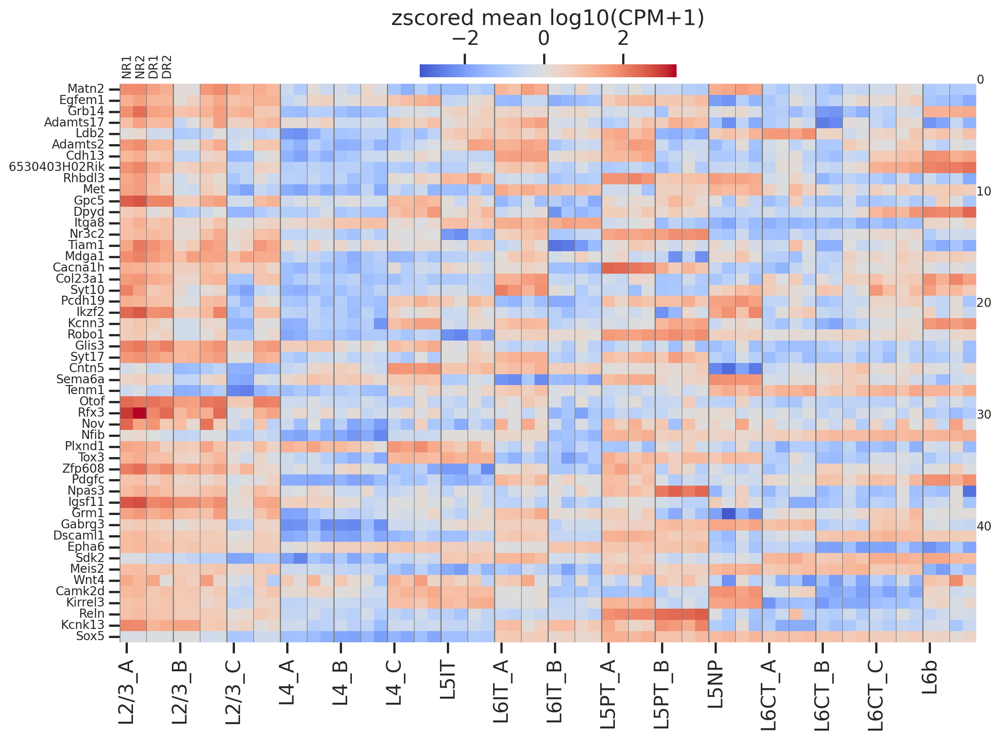

In [44]:
toplot = pd.DataFrame(bigmatz[gidx], index=gsel, columns=np.repeat(types_order_sub,4)).iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot, 
                cmap='coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='zscored mean log10(CPM+1)'),
                center=0,
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_zscore_bigmatz_exc_demo.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_zscore_bigmatz_exc_2023-01-15.pdf


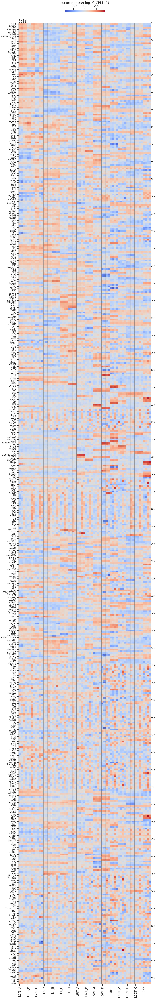

In [42]:
toplot = pd.DataFrame(bigmatz[gidx], index=gsel, columns=np.repeat(types_order_sub,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot, 
                cmap='coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='zscored mean log10(CPM+1)'),
                center=0,
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_zscore_bigmatz_exc.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_bigmat_exc_2023-01-15.pdf


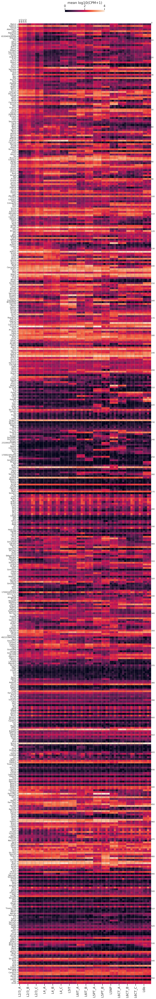

In [43]:
toplot2 = pd.DataFrame(bigmat[gidx], index=gsel, columns=np.repeat(types_order_sub,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot2, 
                cmap='rocket', # _r', #coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='mean log10(CPM+1)'),
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_bigmat_exc.pdf")
    plt.show()